In [242]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import log_loss
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import precision_score, recall_score, precision_recall_curve,f1_score, fbeta_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

from sqlalchemy import create_engine
from sqlalchemy import inspect
import sqlite3

from bs4 import BeautifulSoup   #Use Metis Kernal
import requests
import time, os
import itertools
import re
import pickle
import pandas as pd
import numpy as np
import seaborn as sns

In [3]:
from selenium import webdriver
from selenium.webdriver.common.keys import Keys

chromedriver = "/Applications/chromedriver" # path to the chromedriver executable
os.environ["webdriver.chrome.driver"] = chromedriver

In [4]:
driver = webdriver.Chrome(chromedriver)    #Do not rerun everytime, this opens a new window

In [5]:
all_nba_site = 'https://www.nba.com/news/history-all-nba-teams'

In [6]:
driver.get(all_nba_site)

In [7]:
all_nba_soup = (BeautifulSoup(driver.page_source, 'html.parser'))

In [194]:
engine = create_engine("sqlite:////Users/derekcall/metis/data_engineering/nba_data.db")

In [ ]:
season_average_df = pd.read_sql('''SELECT id, full_name, is_active, SEASON_ID, AVG(MIN) as AVG_MIN, AVG(PTS) as AVG_PTS, \
AVG(STL) as AVG_STL, AVG(REB) as AVG_REB, AVG(AST) as AVG_AST, AVG(FG_PCT) as AVG_FG_PCT, AVG(FGM) as AVG_FGM, \
AVG(FGA) as AVG_FGA, AVG(FG3_PCT) as AVG_FG3_PCT, AVG(FTM) as AVG_FTM, AVG(FT_PCT) as AVG_FT_PCT, \
AVG(FTA) as AVG_FTA, AVG(FG3M) as AVG_FG3M, AVG(FG3A) as AVG_FG3A, AVG(BLK) as AVG_BLK, AVG(PF) as AVG_Fouls, \
AVG(TOV) as AVG_TOV, AVG(OREB) as AVG_OREB, AVG(DREB) as AVG_DREB, AVG(win_perc) as WIN_PER \
FROM nba_all_games GROUP BY SEASON_ID, full_name ''', engine)

In [195]:
pd.read_sql("SELECT id, SEASON_ID, WL, \
(COUNT(WL)*100)/ (SELECT COUNT(*) FROM nba_all_games) AS percentage \
FROM nba_all_games GROUP BY id, SEASON_ID LIMIT 7", engine)

,id,SEASON_ID,WL,percentage
0,2,21983,W,0
1,2,21984,L,0
2,2,21985,W,0
3,2,21986,L,0
4,2,21987,W,0
5,2,21988,W,0
6,2,21989,W,0


In [ ]:
season_average_df['SEASON_ID'] = (season_average_df['SEASON_ID'] - 20000)
season_average_df = season_average_df.round(2)
mvp_list = pd.read_csv('/Users/derekcall/Downloads/mvp_winners.csv')
mvp_df = mvp_list[['year', 'name']]
mvp_df['won_mvp'] = 1

In [ ]:
dpoy_df = pd.read_csv('/Users/derekcall/Downloads/dpoy.csv')
dpoy_df['won_dpoy'] = 1
dpoy_df = dpoy_df[['year', 'player', 'won_dpoy']]

final_mvp_season_df = pd.merge(final_mvp_season_df, dpoy_df,  how='left', left_on=['SEASON_ID','full_name'], \
                               right_on = ['year','player'])
final_mvp_season_df[final_mvp_season_df['won_dpoy']== 1].head(3)

In [ ]:
final_mvp_season_df['won_dpoy'] = final_mvp_season_df['won_dpoy'].replace(np.nan, 0)
final_mvp_season_df.won_dpoy = final_mvp_season_df.won_dpoy.astype(int)

## Cleaning scraped data for All-NBA stats

In [167]:
def cleaning_data():
    all_nba = {}
    decrementer = 2021
    for ele in all_nba_soup.find_all('p')[3:-26]: #this is the list of All-NBA Html
        
        if 'release' not in (ele.text[3:]).split(', ')[0] or '*' not in (ele.text).split(', ')[0]:
            if 'SECOND' in (ele.text).split(', ')[0] or 'THIRD' in (ele.text).split(', ')[0]:
                continue
            if 'FIRST' in (ele.text).split(', ')[0]:
#                 print(decrementer)
                decrementer -= 1
                
                continue
            if ('F:' in (ele.text).split(', ')[0]) or ('G:' in (ele.text).split(', ')[0]) or ('C:' in (ele.text).split(', ')[0]):
                player = (ele.text[3:]).split(', ')[0]
                if player in all_nba.keys():
                    all_nba[player].append(decrementer)
                else:
                    all_nba[player] = [decrementer]
                
            else:
                if (ele.text).split(', ')[0] in all_nba.keys():
                    all_nba[(ele.text).split(', ')[0]].append(decrementer)
                else:
                    all_nba[(ele.text).split(', ')[0]] = [decrementer]
                
    return all_nba

In [191]:
all_nba_dict = cleaning_data()

In [176]:
all_nba_list = []
all_nba_df = pd.DataFrame(columns=(['year','player']))
for player,years in all_nba_dict.items():
    for year in years:
        all_nba_list.append([year, player])
        
new_all_nba_df = pd.DataFrame(all_nba_list)
new_all_nba_df.columns = ['year', 'player']

In [188]:
new_all_nba_df['ALL_NBA'] = 1

In [189]:
new_all_nba_df

,year,player,ALL_NBA
0,2020,Giannis Antetokounmpo,1
1,2019,Giannis Antetokounmpo,1
2,2018,Giannis Antetokounmpo,1
3,2017,Giannis Antetokounmpo,1
4,2016,Giannis Antetokounmpo,1
...,...,...,...
913,1947,Fred Scolari,1
914,1946,Fred Scolari,1
915,1946,Frankie Baumholtz,1
916,1946,Ernie Calverley,1


In [190]:
new_all_nba_df.to_csv('/Users/derekcall/metis/classification/all_nba.csv')

In [192]:
new_all_nba_df


,year,player,ALL_NBA
0,2020,Giannis Antetokounmpo,1
1,2019,Giannis Antetokounmpo,1
2,2018,Giannis Antetokounmpo,1
3,2017,Giannis Antetokounmpo,1
4,2016,Giannis Antetokounmpo,1
...,...,...,...
913,1947,Fred Scolari,1
914,1946,Fred Scolari,1
915,1946,Frankie Baumholtz,1
916,1946,Ernie Calverley,1


In [ ]:
all_nba_mvp_dpoy_df = pd.merge(final_mvp_season_df, new_all_nba_df,  how='left', \
                               left_on=['SEASON_ID','full_name'], \
                               right_on = ['year','player'])

In [ ]:
all_nba_mvp_dpoy_df['ALL_NBA'].value_counts()
all_nba_mvp_dpoy_df['ALL_NBA'] = all_nba_mvp_dpoy_df['ALL_NBA'].replace(np.nan, 0)
all_nba_mvp_dpoy_df.ALL_NBA = all_nba_mvp_dpoy_df.ALL_NBA.astype(int)
all_nba_mvp_dpoy_df = all_nba_mvp_dpoy_df.drop(['player', 'year', 'Unnamed: 0'], axis=1)
all_nba_mvp_dpoy_df.rename(columns={"won_mvp": "MVP", "won_dpoy": "DPOY"}, inplace=True)
all_nba_mvp_dpoy_df.to_csv('/Users/derekcall/metis/classification/all_nba_mvp_dpoy_df.csv')

## Import CSV to start fresh after all the cleaning and merging :)

In [196]:
all_nba_mvp_dpoy_df = pd.read_csv('/Users/derekcall/metis/classification/all_nba_mvp_dpoy_df.csv')

In [205]:
all_nba_mvp_dpoy_df.columns

Index(['Unnamed: 0', 'id', 'full_name', 'is_active', 'SEASON_ID', 'AVG_MIN',
       'AVG_PTS', 'AVG_STL', 'AVG_REB', 'AVG_AST', 'AVG_FG_PCT', 'AVG_FGM',
       'AVG_FGA', 'AVG_FG3_PCT', 'AVG_FTM', 'AVG_FT_PCT', 'AVG_FTA',
       'AVG_FG3M', 'AVG_FG3A', 'AVG_BLK', 'AVG_Fouls', 'AVG_TOV', 'AVG_OREB',
       'AVG_DREB', 'WIN_PER', 'MVP', 'DPOY', 'ALL_NBA'],
      dtype='object')

In [206]:
x_features = ['SEASON_ID', 'AVG_MIN',
       'AVG_PTS', 'AVG_STL', 'AVG_REB', 'AVG_AST', 'AVG_FG_PCT', 'AVG_FGM',
       'AVG_FGA', 'AVG_FG3_PCT', 'AVG_FTM', 'AVG_FT_PCT', 'AVG_FTA',
       'AVG_FG3M', 'AVG_FG3A', 'AVG_BLK', 'AVG_Fouls', 'AVG_TOV', 'AVG_OREB',
       'AVG_DREB', 'WIN_PER']

y_feature = ['ALL_NBA']

In [231]:
all_nba_mvp_dpoy_df['WIN_PER'] = all_nba_mvp_dpoy_df['WIN_PER'].replace(np.nan, 0)


In [232]:
x = all_nba_mvp_dpoy_df[x_features]
y = all_nba_mvp_dpoy_df[y_feature]

In [233]:
x_train, x_test, y_train, y_test = train_test_split(x,y, 
                                                    test_size = 0.2, random_state=42)

In [364]:
train_df = x_train.copy()
train_df['ALL_NBA'] = y_train
train_df['ALL_NBA'].value_counts()

0    17502
1      687
Name: ALL_NBA, dtype: int64

In [371]:
y_test['ALL_NBA'].value_counts()


0    4365
1     183
Name: ALL_NBA, dtype: int64

,SEASON_ID,AVG_MIN,AVG_PTS,AVG_STL,AVG_REB,AVG_AST,AVG_FG_PCT,AVG_FGM,AVG_FGA,AVG_FG3_PCT,...,AVG_FT_PCT,AVG_FTA,AVG_FG3M,AVG_FG3A,AVG_BLK,AVG_Fouls,AVG_TOV,AVG_OREB,AVG_DREB,WIN_PER


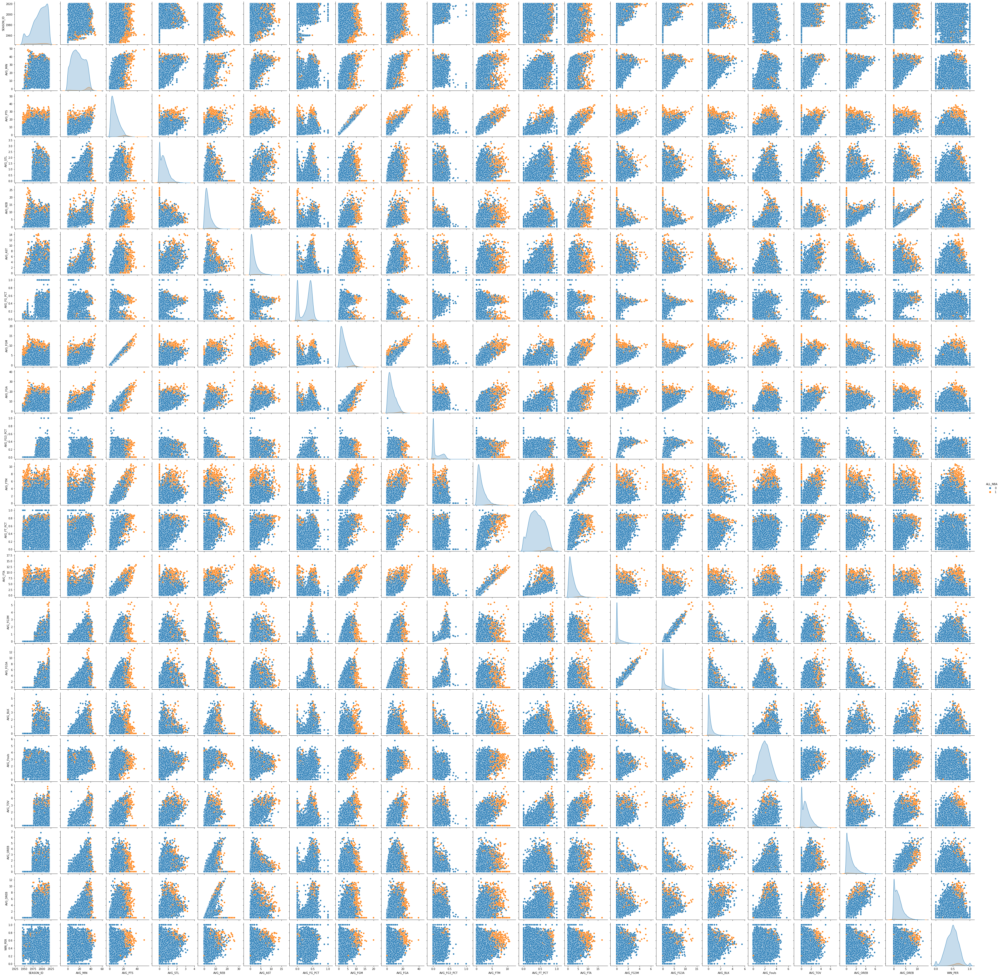

In [220]:
sns.pairplot(train_df, hue='ALL_NBA');

In [268]:
lm1 = LogisticRegression(random_state=15) # setting C very high essentially removes regularization - At default c now
lm1.fit(x_train, y_train)

/Users/derekcall/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)
/Users/derekcall/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression(random_state=15)

In [269]:
lm1.score(x_train, y_train)

0.9746550112705481

In [270]:
lm1.coef_

array([[-0.00482815, -0.06433516,  0.41240827,  0.0896613 ,  0.22179984,
         0.50291166, -0.01315543,  0.14168438, -0.23571582, -0.00127389,
         0.13286167,  0.01359009,  0.05625307, -0.00374688, -0.05031186,
         0.08794768, -0.12356487, -0.1026363 , -0.0525139 ,  0.11345604,
         0.12972698]])

## Decision Tree Model

In [278]:
decisiontree = DecisionTreeClassifier(max_depth=3, random_state=12)

In [279]:
decisiontree.fit(x_train, y_train)

DecisionTreeClassifier(max_depth=3, random_state=12)

In [280]:
decisiontree.score(x_train, y_train)

0.9747099895541261

In [306]:
decisiontree.score(x_test, y_test)

0.9700967458223395

In [307]:
decisiontree.feature_importances_

array([0.03311438, 0.        , 0.66425384, 0.        , 0.        ,
       0.0176606 , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.05677264, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.22819854])

## Random Forest Model

In [325]:
randomforest = RandomForestClassifier(n_estimators=100, random_state=11)

In [326]:
randomforest.fit(x_train, y_train)

<ipython-input-326-e1fd2dbde928>:1: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  randomforest.fit(x_train, y_train)


RandomForestClassifier(random_state=11)

In [327]:
randomforest.score(x_test, y_test)

0.980650835532102

In [328]:
randomforest.feature_importances_

array([0.03254811, 0.03948084, 0.13673408, 0.02703424, 0.05683234,
       0.05383692, 0.02118424, 0.08086243, 0.06167201, 0.01027527,
       0.11030712, 0.04530276, 0.08268066, 0.01074673, 0.01150347,
       0.02079124, 0.02527688, 0.02318487, 0.01732251, 0.02790624,
       0.10451706])

<BarContainer object of 21 artists>

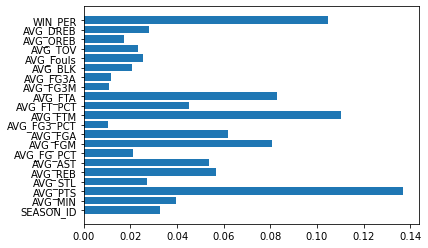

In [329]:
plt.barh(x_features, randomforest.feature_importances_)

<BarContainer object of 21 artists>

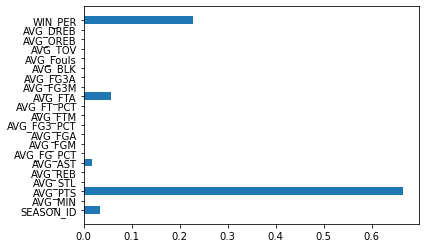

In [315]:
plt.barh(x_features, decisiontree.feature_importances_)

In [331]:
rf_sorted_idx = randomforest.feature_importances_.argsort()
np.array(x_features)[rf_sorted_idx]

array(['AVG_FG3_PCT', 'AVG_FG3M', 'AVG_FG3A', 'AVG_OREB', 'AVG_BLK',
       'AVG_FG_PCT', 'AVG_TOV', 'AVG_Fouls', 'AVG_STL', 'AVG_DREB',
       'SEASON_ID', 'AVG_MIN', 'AVG_FT_PCT', 'AVG_AST', 'AVG_REB',
       'AVG_FGA', 'AVG_FGM', 'AVG_FTA', 'WIN_PER', 'AVG_FTM', 'AVG_PTS'],
      dtype='<U11')

In [332]:
np.array(x_features)[sorted_idx]

rf_clean_names_barh = ['Three Point Percentage', 'Three Point Makes', 'Three Point Attempts', 'Offensive Rebounds', 
       'Blocks', 'Field Goal Percentage', 'Turnovers', 'Fouls', 'Steals', 'Defensive Rebounds',
       'Year','Minutes', 'Free Throw Percentage', 'Assists', 'Rebounds','Field Goal Attempts', 
       'Field Goal Makes', 'Free Throw Attempts','Winning Percentage', 'Free Throw Makes',
       'Points']

dt_sorted_idx = decisiontree.feature_importances_.argsort()
np.array(x_features)[dt_sorted_idx]

dt_clean_names_barh = ['Free Throw Makes', 'Three Point Attempts', 'Three Point Makes', 'Turnovers', 'Free Throw Percentage',
       'Defensive Rebounds', 'Three Point Percentage', 'Blocks', 'Field Goal Attempts', 'Field Goal Percentage',
       'Total Rebounds', 'Steals', 'Offensive Rebounds', 'Minutes', 'Field Goal Makes',
       'Fouls', 'Assists', 'Year', 'Free Throw Attempts', 'Winning Percentage',
       'Points']

Text(0.5, 0, 'Decision Tree')

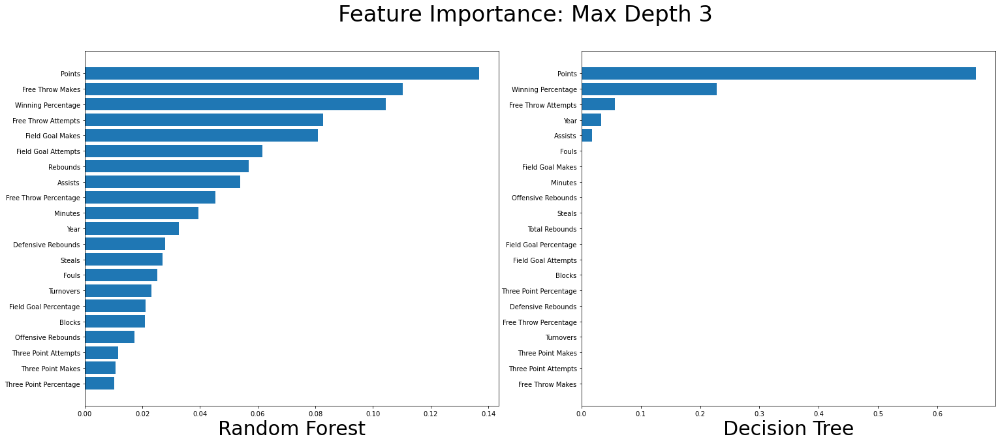

In [333]:
fig = plt.figure(figsize=[25,10])
plt.suptitle('Feature Importance: Max Depth 3',fontsize = 34)

plt.subplot(1,2,1)
sorted_idx = randomforest.feature_importances_.argsort()
plt.barh(rf_clean_names_barh, randomforest.feature_importances_[sorted_idx])
plt.xlabel("Random Forest", fontsize=30)

plt.subplot(1,2,2)
dt_sorted_idx = decisiontree.feature_importances_.argsort()
plt.barh(dt_clean_names_barh, decisiontree.feature_importances_[dt_sorted_idx])
plt.xlabel("Decision Tree", fontsize=30)

In [334]:
sorted_idx

array([ 9, 13, 14, 18, 15,  6, 17, 16,  3, 19,  0,  1, 11,  5,  4,  8,  7,
       12, 20, 10,  2])

## Random Forest - Important Features

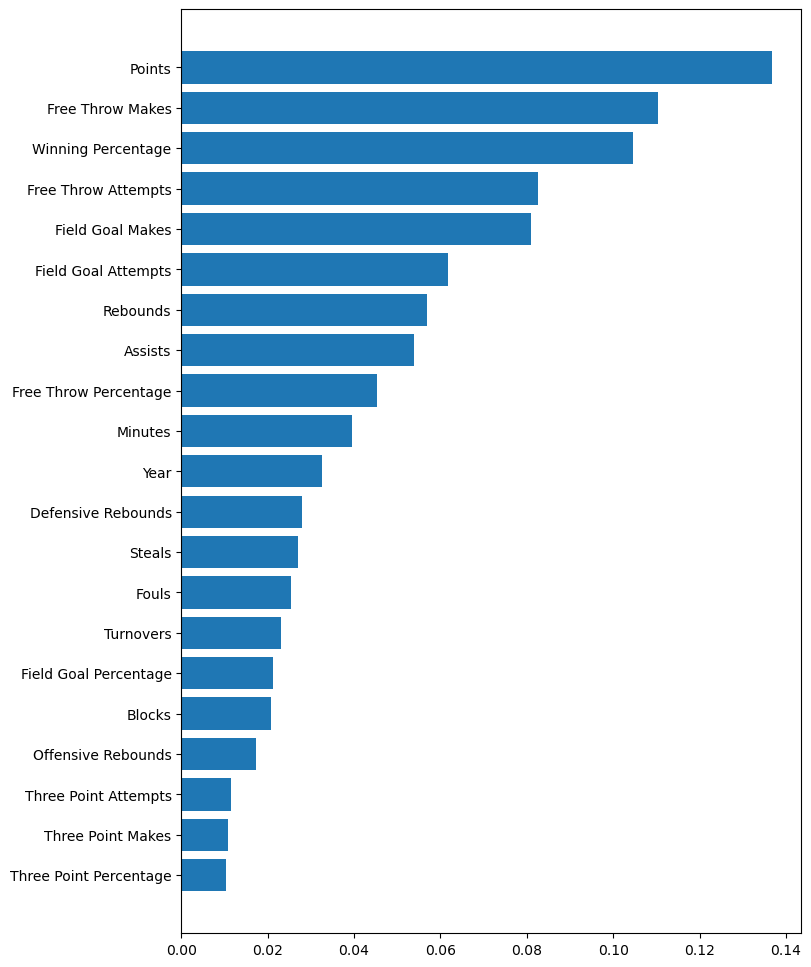

In [456]:
fig = plt.figure(figsize=[8,12])


# plt.title('Feature Importance',fontsize = 34)
# ax.set_facecolor('white')
sorted_idx = randomforest.feature_importances_.argsort()
plt.barh(rf_clean_names_barh, randomforest.feature_importances_[sorted_idx])
plt.style.use('default')
# plt.set_facecolor('white')
# plt.xlabel("Random Forest", fontsize=30)

## Logistic Regression Model - SMOTE

In [340]:
from imblearn.over_sampling import SMOTE
x_smoted, y_smoted = SMOTE(random_state=42).fit_sample(x,y)

In [489]:
from collections import Counter

In [344]:
from imblearn.over_sampling import RandomOverSampler
ros = RandomOverSampler(random_state=0)
x_resampled, y_resampled = ros.fit_sample(x,y)

In [346]:
from sklearn.svm import LinearSVC, SVC

In [350]:
smote = SMOTE(random_state = 42)
    
x_tr_smote, y_tr_smote = smote.fit_resample(x_train, y_train)

lr_smote = LogisticRegression(solver='liblinear') 
lr_smote.fit(x_tr_smote, y_tr_smote)

/Users/derekcall/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)


LogisticRegression(solver='liblinear')

In [352]:
from sklearn.metrics import f1_score, roc_auc_score

In [353]:
print('Logistic Regression on SMOTE Train Data; Test F1: %.3f, Test AUC: %.3f' % \
      (f1_score(y_test, lr_smote.predict(x_test)), roc_auc_score(y_test, lr_smote.predict_proba(x_test)[:,1])))

Logistic Regression on SMOTE Train Data; Test F1: 0.580, Test AUC: 0.986


## F1, Precision, Accuracy, Recall Graph

Logistic Regression Model best F1 score 0.706 at prob decision threshold >= 0.925


<ipython-input-485-f0efa2667f33>:29: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax = plt.axes()


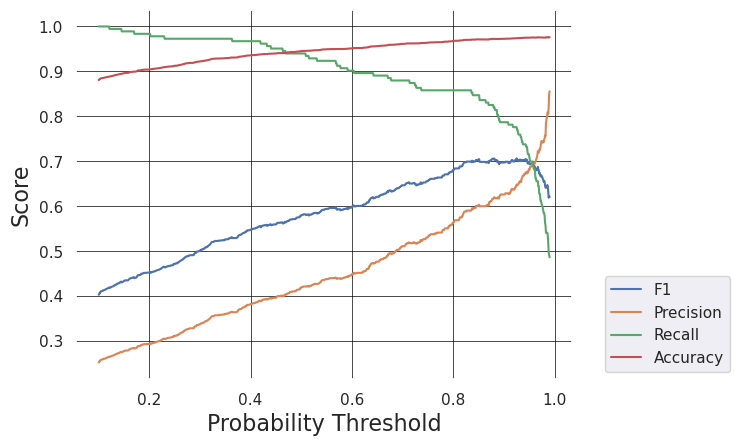

In [485]:
from sklearn.metrics import precision_score, recall_score, accuracy_score

import matplotlib.pyplot as plt
# %matplotlib inline
import seaborn as sns
sns.set()

x_val, y_val = x_test, y_test # explicitly calling this validation since we're using it for selection

thresh_ps = np.linspace(.10,.99,1000)
model_val_probs = lr_smote.predict_proba(x_val)[:,1] # positive class probs, same basic logistic model we fit in section 2 

f1_scores, prec_scores, rec_scores, acc_scores = [], [], [], []
for p in thresh_ps:
    model_val_labels = model_val_probs >= p
    f1_scores.append(f1_score(y_val, model_val_labels))    
    prec_scores.append(precision_score(y_val, model_val_labels))
    rec_scores.append(recall_score(y_val, model_val_labels))
    acc_scores.append(accuracy_score(y_val, model_val_labels))
    
plt.plot(thresh_ps, f1_scores)

plt.plot(thresh_ps, prec_scores)

plt.plot(thresh_ps, rec_scores)

plt.plot(thresh_ps, acc_scores)

ax = plt.axes()
ax.set_facecolor("white")
plt.grid(color = 'black', linewidth = 0.5)
# plt.title('Varied Scores vs Probability Threshold', size=20)
plt.legend(['F1','Precision','Recall','Accuracy'], bbox_to_anchor=(1.05, 0), loc='lower left')
plt.xlabel('Probability Threshold', size=16)
plt.ylabel('Score', size= 16)
plt.style.use('default')

best_f1_score = np.max(f1_scores) 
best_thresh_p = thresh_ps[np.argmax(f1_scores)]

print('Logistic Regression Model best F1 score %.3f at prob decision threshold >= %.3f' 
      % (best_f1_score, best_thresh_p))

In [486]:
model_val_labels = model_val_probs >= 0.925
print(f'Recall score at threshold >= 0.925 is {round(recall_score(y_val, model_val_labels),3)}')
print(f'Accuracy score at threshold >= 0.925 is {round(accuracy_score(y_val, model_val_labels),3)}')
print(f'Precision score at threshold >= 0.925 is {round(precision_score(y_val, model_val_labels),3)}')




Recall score at threshold >= 0.925 is 0.776
Accuracy score at threshold >= 0.925 is 0.974
Precision score at threshold >= 0.925 is 0.648


In [384]:
lr_smote.coef_

array([[-7.75390667e-03, -9.56307648e-02,  9.65918463e-01,
         5.66968281e-01,  2.29658507e-01,  6.85237550e-01,
        -1.12855243e+00, -5.10901605e-01, -3.93068755e-01,
        -7.87581407e-01,  5.17609081e-01, -1.49982862e+00,
        -2.16321124e-01,  1.52471345e+00, -5.22375320e-01,
         1.20322893e+00, -3.01083423e-01, -8.47439339e-01,
         3.71290811e-01,  1.24795893e-01,  1.05353789e+01]])

In [390]:
coef_dict = {}
for coef, feat in zip(lr_smote.coef_[0], x_features):
    coef_dict[feat] = coef

In [488]:
for k,v in coef_dict.items():
    print(f'{k}: {round(v,4)}')

SEASON_ID: -0.0078
AVG_MIN: -0.0956
AVG_PTS: 0.9659
AVG_STL: 0.567
AVG_REB: 0.2297
AVG_AST: 0.6852
AVG_FG_PCT: -1.1286
AVG_FGM: -0.5109
AVG_FGA: -0.3931
AVG_FG3_PCT: -0.7876
AVG_FTM: 0.5176
AVG_FT_PCT: -1.4998
AVG_FTA: -0.2163
AVG_FG3M: 1.5247
AVG_FG3A: -0.5224
AVG_BLK: 1.2032
AVG_Fouls: -0.3011
AVG_TOV: -0.8474
AVG_OREB: 0.3713
AVG_DREB: 0.1248
WIN_PER: 10.5354


In [401]:
lr_feature_order = []

for i in sorted_idx:
    lr_feature_order.append(x_features[i])
    
lr_feature_order

['AVG_FG3_PCT',
 'AVG_FG3M',
 'AVG_FG3A',
 'AVG_OREB',
 'AVG_BLK',
 'AVG_FG_PCT',
 'AVG_TOV',
 'AVG_Fouls',
 'AVG_STL',
 'AVG_DREB',
 'SEASON_ID',
 'AVG_MIN',
 'AVG_FT_PCT',
 'AVG_AST',
 'AVG_REB',
 'AVG_FGA',
 'AVG_FGM',
 'AVG_FTA',
 'WIN_PER',
 'AVG_FTM',
 'AVG_PTS']

In [408]:
lr_coef_names_dict = {}

for i, num in enumerate(lr_feature_order):
    lr_coef_names_dict[rf_clean_names_barh[i]] = round(coef_dict[num], 4)

## Logistic Regression Coefficients

In [409]:

print(lr_coef_names_dict)

{'Three Point Percentage': -0.7876,
 'Three Point Makes': 1.5247,
 'Three Point Attempts': -0.5224,
 'Offensive Rebounds': 0.3713,
 'Blocks': 1.2032,
 'Field Goal Percentage': -1.1286,
 'Turnovers': -0.8474,
 'Fouls': -0.3011,
 'Steals': 0.567,
 'Defensive Rebounds': 0.1248,
 'Year': -0.0078,
 'Minutes': -0.0956,
 'Free Throw Percentage': -1.4998,
 'Assists': 0.6852,
 'Rebounds': 0.2297,
 'Field Goal Attempts': -0.3931,
 'Field Goal Makes': -0.5109,
 'Free Throw Attempts': -0.2163,
 'Winning Percentage': 10.5354,
 'Free Throw Makes': 0.5176,
 'Points': 0.9659}

In [415]:
confusion_matrix(y_test, lr_smote.predict(x_test))

array([[4127,  238],
       [  11,  172]])

In [360]:
# fit a model
model = LogisticRegression(solver='lbfgs')
model.fit(x_train, y_train)
# predict probabilities
lr_smote_probs = lr_smote.predict_proba(x_test)
# keep probabilities for the positive outcome only
lr_smote_probs = lr_smote_probs[:, 1]

/Users/derekcall/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)
/Users/derekcall/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


## ROC Curve

In [361]:
# calculate scores
lr_smote_auc = roc_auc_score(y_test, lr_smote_probs)

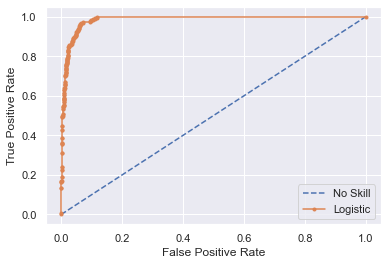

In [363]:
# roc curve for logistic regression model
from sklearn.datasets import make_classification
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve
from matplotlib import pyplot

lr_smote_probs = lr_smote.predict_proba(x_test)
# keep probabilities for the positive outcome only
lr_smote_probs = lr_smote_probs[:, 1]

# predict probabilities
y_hat = lr_smote.predict_proba(x_test)
# keep probabilities for the positive outcome only
y_hat = y_hat[:, 1]
# calculate roc curves
fpr, tpr, thresholds = roc_curve(y_test, y_hat)
# plot the roc curve for the model
pyplot.plot([0,1], [0,1], linestyle='--', label='No Skill')
pyplot.plot(fpr, tpr, marker='.', label='Logistic')
# axis labels
pyplot.xlabel('False Positive Rate')
pyplot.ylabel('True Positive Rate')
pyplot.legend()
# show the plot
pyplot.show()

## Naive Bayes Gaussian Model

In [410]:
from sklearn.naive_bayes import GaussianNB

In [412]:
nb_model = GaussianNB()
nb_model.fit(x_train, y_train)
nb_model.score(x_test, y_test)

/Users/derekcall/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)


0.8891820580474934

In [413]:
from sklearn.metrics import confusion_matrix

In [414]:
confusion_matrix(y_test, nb_model.predict(x_test))

array([[3880,  485],
       [  19,  164]])